## Shap values - third interpretability technique

In [1]:
# import all necessary modules
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import numpy as np

from keras.utils import np_utils
from PIL import Image
from keras.models import Sequential
import keras
from keras.layers import Dense, Dropout, Activation, Conv2D, MaxPooling2D, Flatten
from keras import optimizers
from keras import losses
from tensorflow.keras.layers import AveragePooling2D
from sklearn import metrics
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_class_weight
from keras.callbacks import EarlyStopping

#from Interpretability import * 
import matplotlib.cm as cm
from keras.preprocessing import image
from skimage import img_as_ubyte
from skimage.transform import resize
import cv2

import shap
from skimage.segmentation import slic

from matplotlib.colors import LinearSegmentedColormap
import time

from mpl_toolkits.axes_grid1 import ImageGrid

## Loading data and model 

In [6]:
## loading data
x_train = np.load("MIAS_X_train_roi_multi.npy") / 255
y_train = np.load("MIAS_y_train_roi_multi.npy")
x_valid = np.load("MIAS_X_valid_roi_multi.npy") / 255
y_valid = np.load("MIAS_y_valid_roi_multi.npy") 
x_test = np.load("MIAS_X_test_roi_multi.npy") / 255
y_test = np.load("MIAS_y_test_roi_multi.npy") 

# pring unique counts of all labels
print(np.unique(y_train, return_counts = True))

# One-hot encode labels
num_classes = 3
y_train = np_utils.to_categorical(y_train, num_classes)
y_valid = np_utils.to_categorical(y_valid, num_classes)
y_test = np_utils.to_categorical(y_test, num_classes)


## load model 
model = keras.models.load_model('best_model.h5', compile = False)
model.summary()

# de-hot-encode hot-encoded labels (1 0 0) -> 0
labels = np.argmax(y_test, axis=1)

(array([0, 1, 2]), array([528, 528, 528], dtype=int64))
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 16)      1216      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 106, 106, 16)      6416      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 16)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 53, 53, 14)        2030      
                                                                

## Shap value function with segmentation

In [10]:
## based on https://medium.com/@tibastar/explain-the-prediction-for-imagenet-using-shap-468ec5bc9904

# define the shap-value function 
def shapvals(img, y_true, seg = 100, compact = 1):
    
    # perform image segmentation using SLIC algorithm (Simple Linear Iterative Clustering)
    segments_slic = slic(img, n_segments=seg, compactness = compact) 
    
    # function to mask the image with specified background color
    # use segmented image for not having to define all pixels but only superpixels
    def mask_image(zs, segmentation, image, background=None):
        if background is None:
            background = image.mean((0,1))
        out = np.zeros((zs.shape[0], image.shape[0], image.shape[1], image.shape[2]))
        for i in range(zs.shape[0]):
            out[i,:,:,:] = image
            for j in range(zs.shape[1]):
                if zs[i,j] == 0:
                    out[i][segmentation == j,:] = background
        return out
    # function to predict the class probabilities of the masked image using the pre-trained model
    def f(z):
        return model.predict(mask_image(z, segments_slic, img, 255))

    # use Kernel SHAP to explain the network's predictions
    # Kernel SHAP is a model-agnostic method that uses a variant of the Shapley values concept to estimate the importance
    # of each feature (in this case, pixels) to the model's output
    explainer = shap.KernelExplainer(f, np.zeros((1,50)))

    # calculate SHAP values for the input image and keep track of time
    start = time.time()
    shap_values = explainer.shap_values(np.ones((1,50)), nsamples=1000)
    end = time.time()
    time_taken = end - start
    
    # get the top predictions from the model
    preds = np.argmax(model.predict(np.array([img])))
    top_preds = np.argsort(-preds)
    inds = top_preds[0]
    
    # get the predicted probabilities for each class
    preds = model.predict(np.array([img]))[0]
    sorted_preds = np.argsort(preds)[::-1]
    #class_probs = [(class_names[str(inds[i])])[1], preds[0, inds[i]])for i in range(3)]
    #class_probs_sorted = sorted(class_probs, key = lambda x:x[1], reverse = True)
    
    # map the class indices to their corresponding names
    class_names = ["Normal", "Benign", "Malignant"]
    #top_10_pred=pd.Series(data={class_names[str(inds[i])][1]:preds[0, inds[i]] for i in range(3)})
    #top_10_pred.plot(kind='bar', title='Top 10 Predictions')

    # create a color map for the SHAP values
    colors = []
    for l in np.linspace(1,0,100):
        colors.append((245/255,39/255,87/255,l))
    for l in np.linspace(0,1,100):
        colors.append((24/255,196/255,93/255,l))

    # function to fill the image segments with their corresponding SHAP values
    cm = LinearSegmentedColormap.from_list("shap", colors)
    
    # Visualize the explanations
    def fill_segmentation(values, segmentation):
        out = np.zeros(segmentation.shape)
        for i in range(len(values)):
            out[segmentation == i] = values[i]
        return out
    
    # plot our explanations
    print(f"Actual: {class_names[y_true]} \n Predicted: {class_names[sorted_preds[0]]}")
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(12,4))
    inds = top_preds[0]
    # plot the original image
    axes[0].imshow(img)
    axes[0].set_title(f"Original Image ({class_names[y_true]})", fontsize = 12)
    axes[0].axis('off')
    # plot the segmented image
    axes[1].imshow(segments_slic)
    axes[1].set_title(f"Segmented Image ", fontsize = 12)
    axes[1].axis('off')
    max_val = np.max([np.max(np.abs(shap_values[i][:,:-1])) for i in range(len(shap_values))])
    for i in range(3):
        # plot the SHAP values for all explanations by using the original image and segmentation map
        #class_name = class_probs_sorted[i][0]
       # class_prob = class_probs_sorted[i][1]
        if i == 0: # we give the segmentation (for the pred class)a different name in order to be able to return it
            filled_seg = fill_segmentation(shap_values[i][0], segments_slic)
            axes[i+2].set_title(f"Prediction: {class_names[sorted_preds[i]]}", fontsize = 12)
            axes[i+2].imshow(img, alpha=0.8)
            im = axes[i+2].imshow(filled_seg, cmap=cm, vmin=-max_val, vmax=max_val)
            axes[i+2].axis('off')
        else:
            m = fill_segmentation(shap_values[i][0], segments_slic)
            axes[i+2].set_title(f"Prediction: {class_names[sorted_preds[i]]}", fontsize = 12)
            axes[i+2].imshow(img, alpha=0.8)
            im = axes[i+2].imshow(m, cmap=cm, vmin=-max_val, vmax=max_val)
            axes[i+2].axis('off')
    # create a colorbar for the plot
    cb = fig.colorbar(im, ax=axes.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=100)
    cb.outline.set_visible(False)
   # plt.tight_layout()
    plt.show()
    print(f"SHAP Kernel took  {time_taken} seconds to compute an explanation")
    return img, filled_seg, cm, max_val, time_taken # return original image, filled segmentation, cmap, the max shap values, and time taken
    


In [11]:
time.time()

1684007447.071786

In [6]:
print(f"The total time used to compute KernelSHAP values were on average {total_time/len(labels)} seconds")


The total time used to compute KernelSHAP values were on average 4.481309960285823 seconds


## Extract all explanations and their running time

1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step
Actual: Normal 
 Predicted: Normal


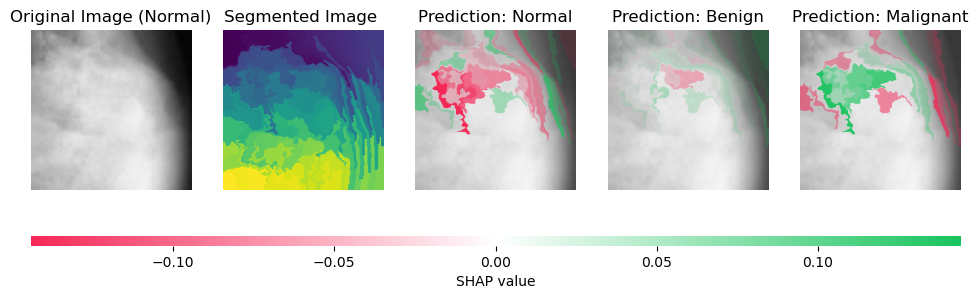

SHAP Kernel took  4.853373765945435 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Benign 
 Predicted: Malignant


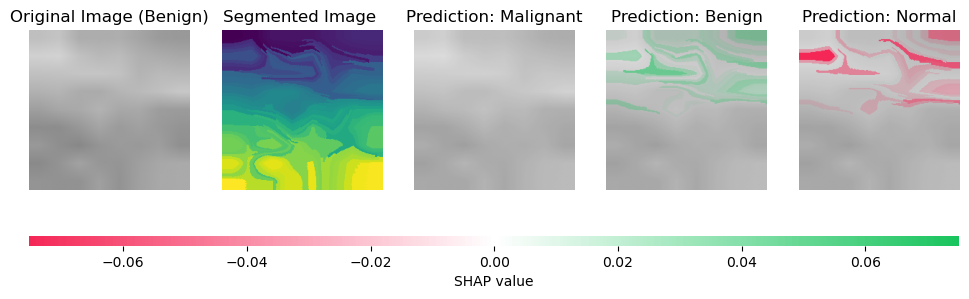

SHAP Kernel took  4.539135456085205 seconds to compute an explanation
1/1 [==============================] - 0s 20ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step
Actual: Benign 
 Predicted: Benign


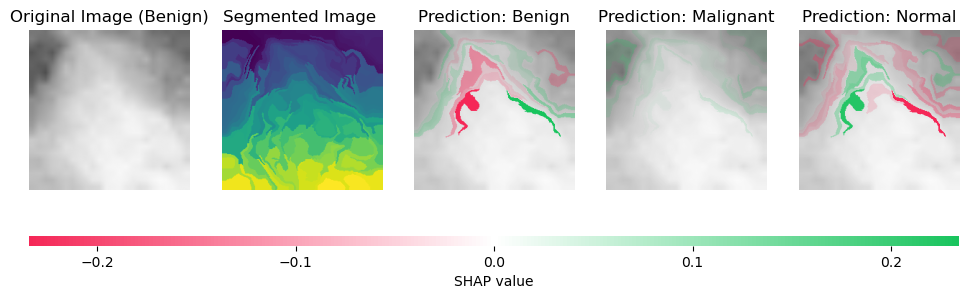

SHAP Kernel took  4.503421783447266 seconds to compute an explanation
1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step
Actual: Normal 
 Predicted: Normal


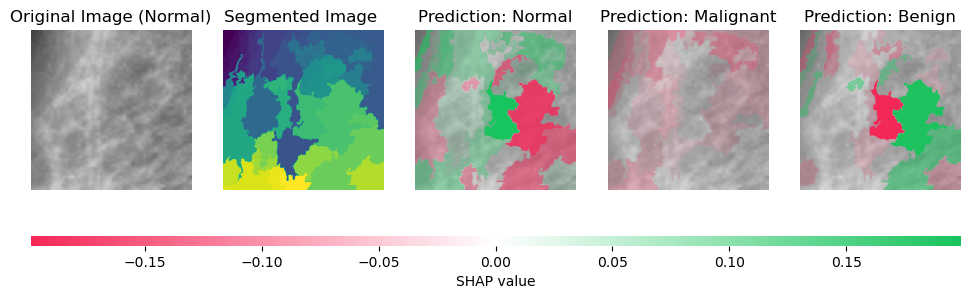

SHAP Kernel took  4.596627235412598 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step
Actual: Malignant 
 Predicted: Normal


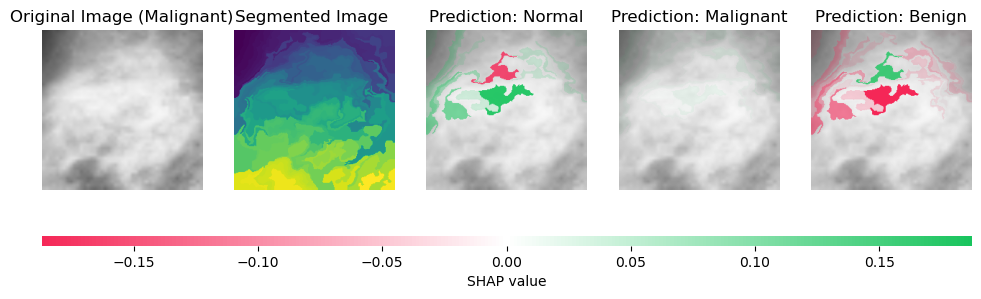

SHAP Kernel took  4.446315288543701 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 10ms/step
Actual: Normal 
 Predicted: Normal


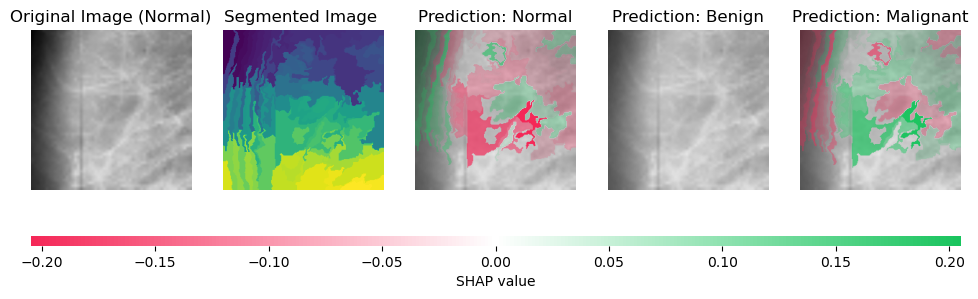

SHAP Kernel took  4.735592842102051 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step
Actual: Normal 
 Predicted: Normal


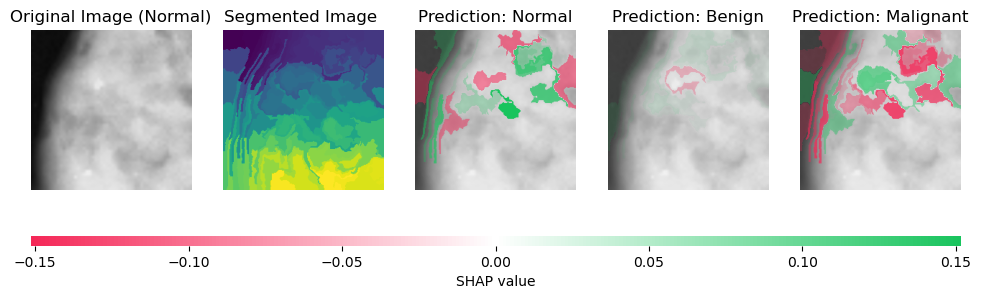

SHAP Kernel took  4.707676887512207 seconds to compute an explanation
1/1 [==============================] - 0s 8ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step
Actual: Normal 
 Predicted: Normal


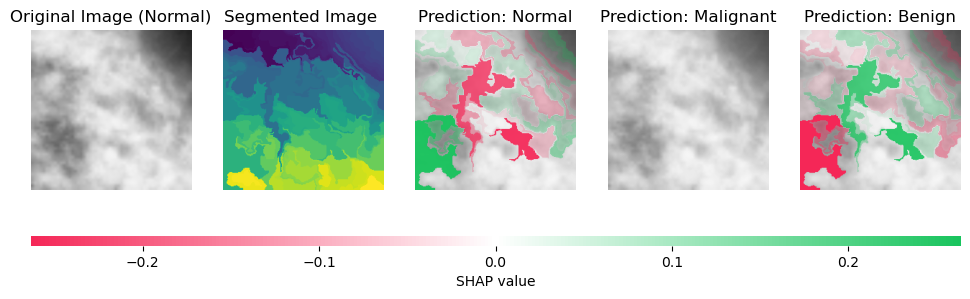

SHAP Kernel took  4.567707300186157 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


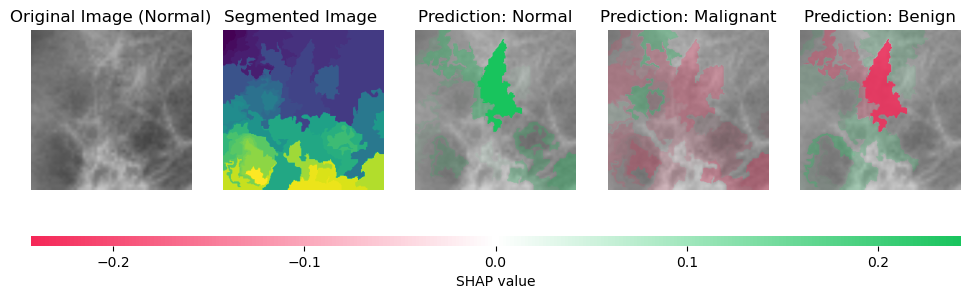

SHAP Kernel took  4.2984232902526855 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step
Actual: Malignant 
 Predicted: Malignant


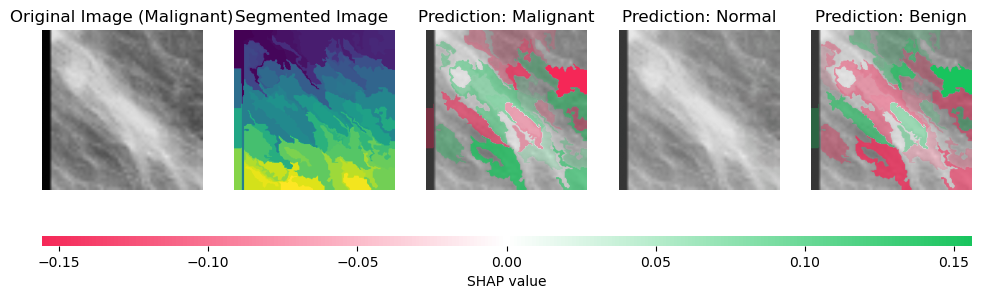

SHAP Kernel took  4.765817165374756 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


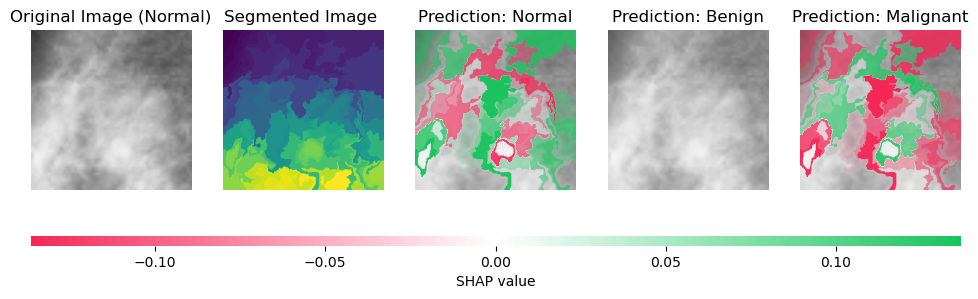

SHAP Kernel took  4.585365533828735 seconds to compute an explanation
1/1 [==============================] - 0s 30ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step
Actual: Normal 
 Predicted: Normal


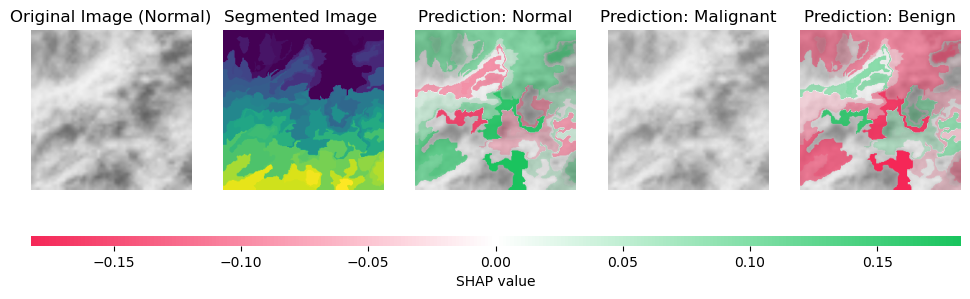

SHAP Kernel took  4.707575559616089 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


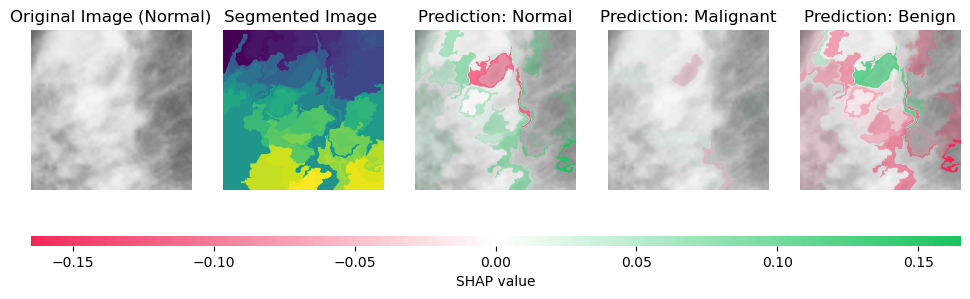

SHAP Kernel took  4.838062286376953 seconds to compute an explanation
1/1 [==============================] - 0s 20ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step
Actual: Benign 
 Predicted: Malignant


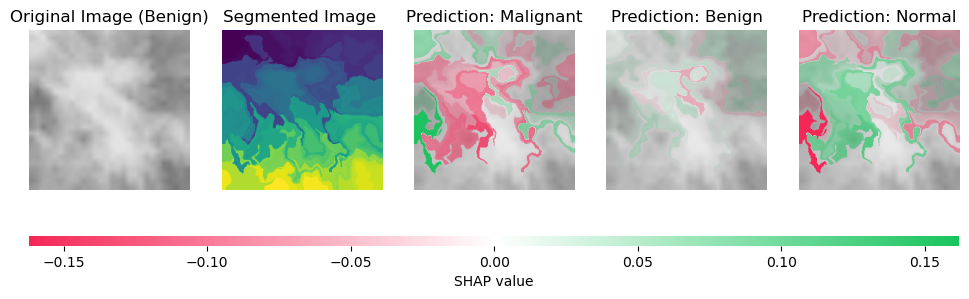

SHAP Kernel took  4.5686163902282715 seconds to compute an explanation
1/1 [==============================] - 0s 21ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step
Actual: Benign 
 Predicted: Malignant


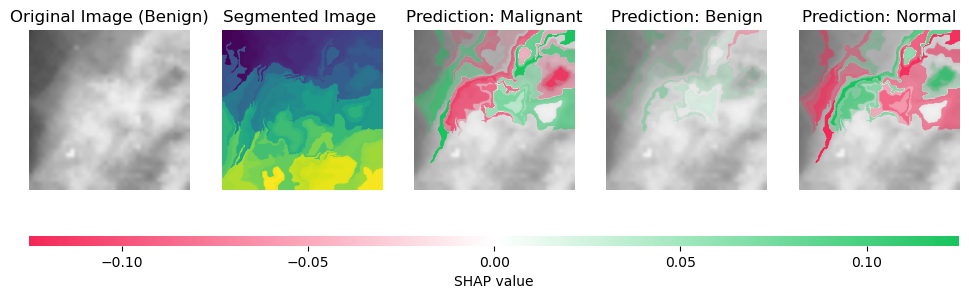

SHAP Kernel took  4.49167013168335 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step
Actual: Benign 
 Predicted: Benign


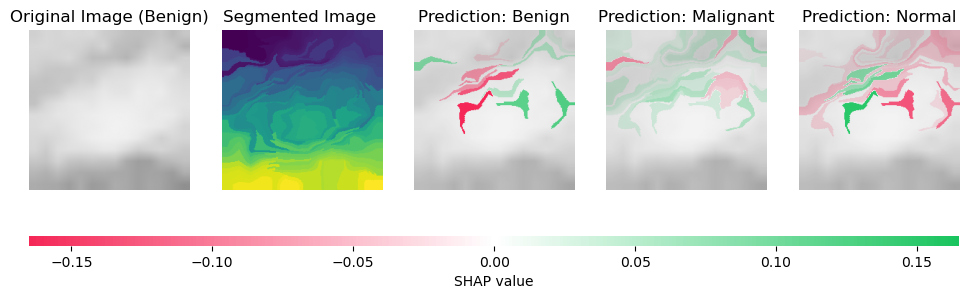

SHAP Kernel took  4.651075124740601 seconds to compute an explanation
1/1 [==============================] - 0s 20ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Benign 
 Predicted: Benign


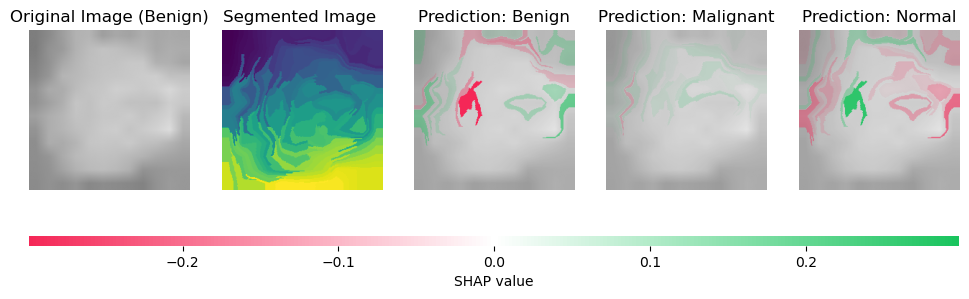

SHAP Kernel took  4.547921895980835 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step
Actual: Benign 
 Predicted: Benign


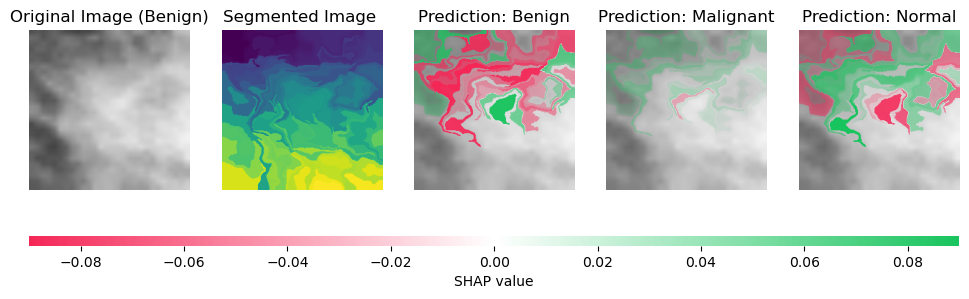

SHAP Kernel took  4.5102219581604 seconds to compute an explanation
1/1 [==============================] - 0s 20ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 14ms/step
Actual: Normal 
 Predicted: Normal


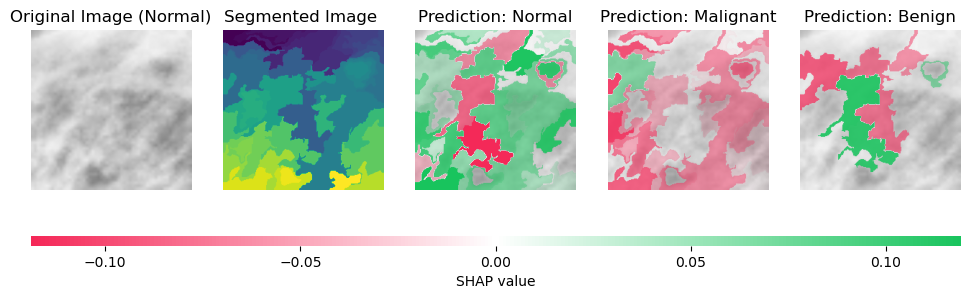

SHAP Kernel took  4.62396764755249 seconds to compute an explanation
1/1 [==============================] - 0s 21ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


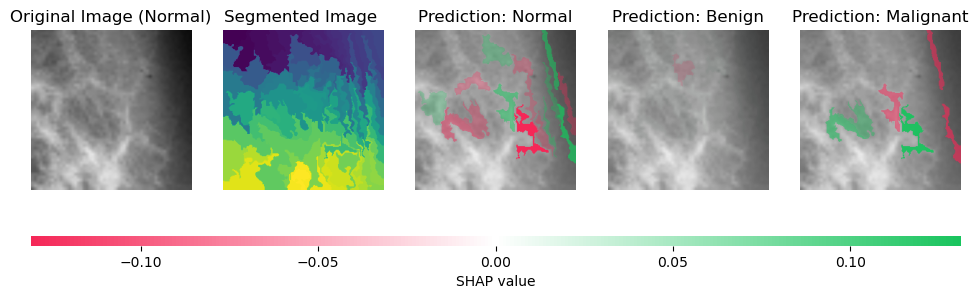

SHAP Kernel took  4.646247625350952 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


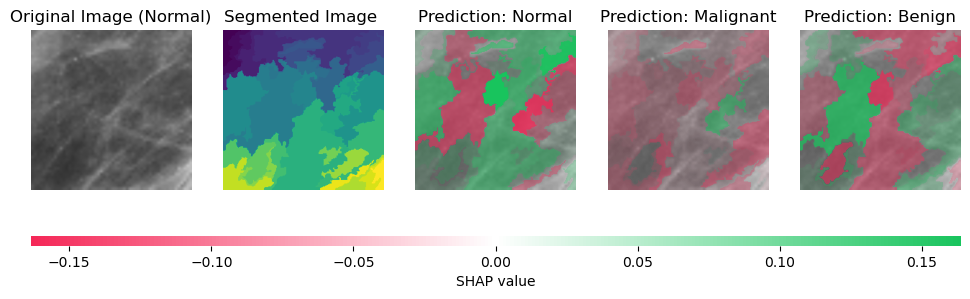

SHAP Kernel took  4.296318054199219 seconds to compute an explanation
1/1 [==============================] - 0s 20ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


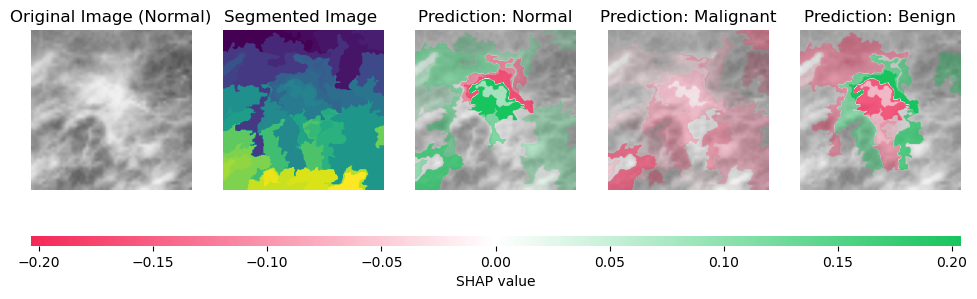

SHAP Kernel took  4.796478986740112 seconds to compute an explanation
1/1 [==============================] - 0s 21ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step
Actual: Normal 
 Predicted: Normal


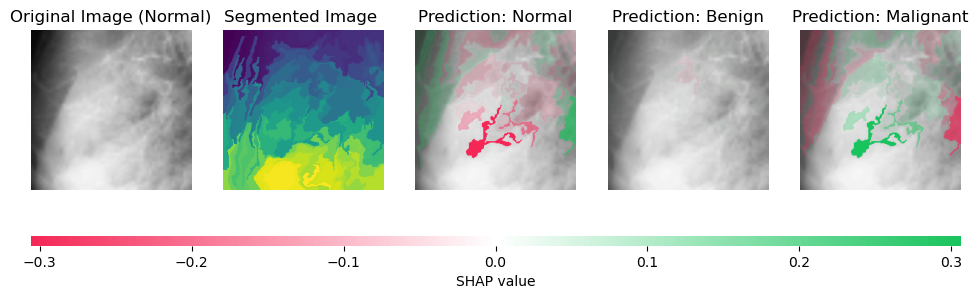

SHAP Kernel took  4.680804491043091 seconds to compute an explanation
1/1 [==============================] - 0s 17ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


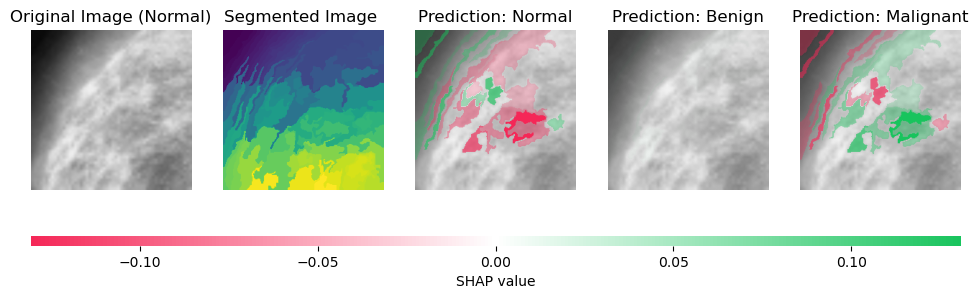

SHAP Kernel took  4.979144096374512 seconds to compute an explanation
1/1 [==============================] - 0s 23ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step
Actual: Normal 
 Predicted: Normal


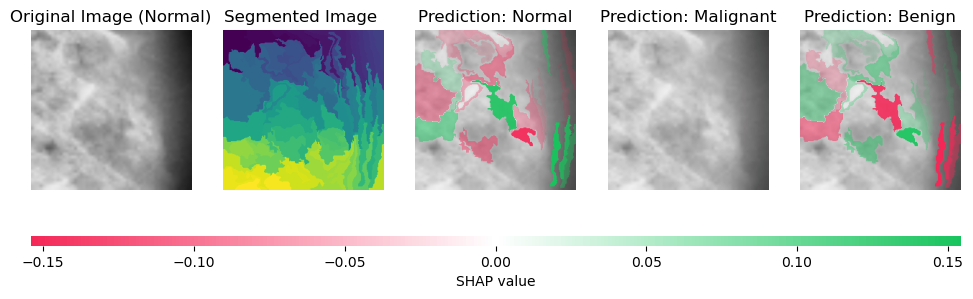

SHAP Kernel took  4.86645770072937 seconds to compute an explanation
1/1 [==============================] - 0s 21ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step
Actual: Normal 
 Predicted: Normal


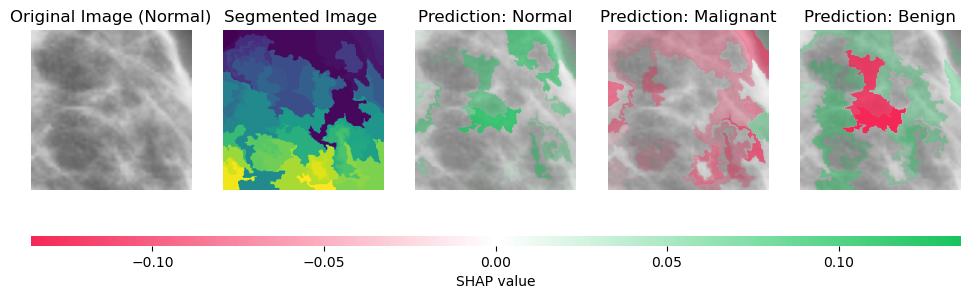

SHAP Kernel took  4.653580665588379 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step
Actual: Normal 
 Predicted: Normal


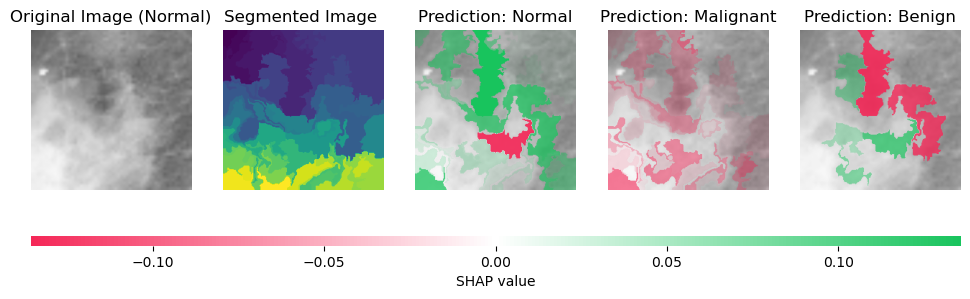

SHAP Kernel took  4.880166530609131 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step
Actual: Normal 
 Predicted: Normal


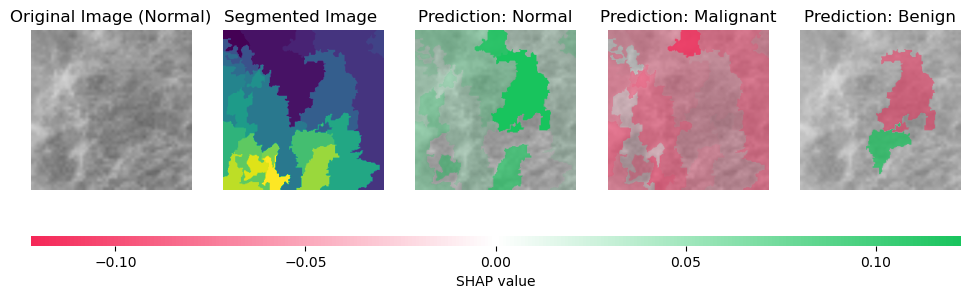

SHAP Kernel took  4.452957630157471 seconds to compute an explanation
1/1 [==============================] - 0s 17ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step
Actual: Malignant 
 Predicted: Benign


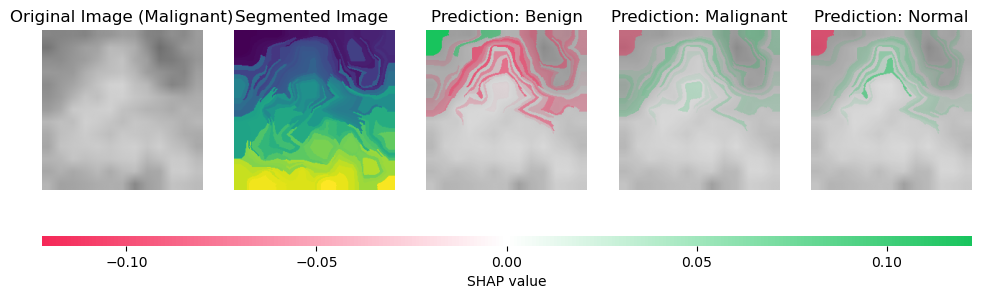

SHAP Kernel took  4.885101079940796 seconds to compute an explanation
1/1 [==============================] - 0s 32ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step
Actual: Normal 
 Predicted: Normal


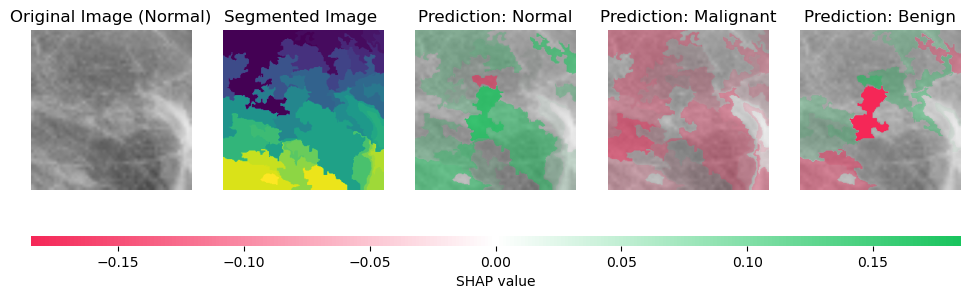

SHAP Kernel took  4.35381007194519 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step
Actual: Malignant 
 Predicted: Benign


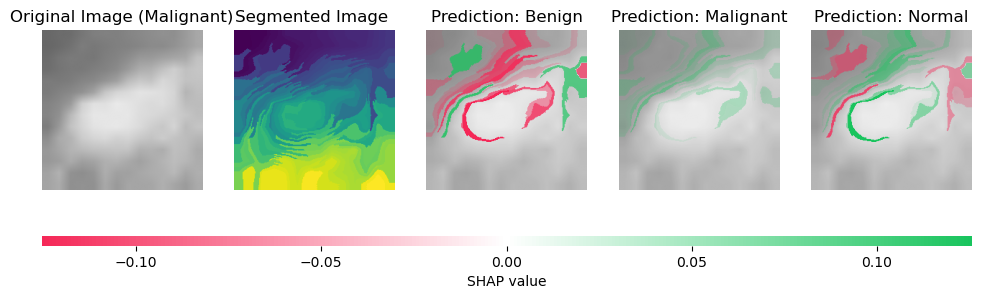

SHAP Kernel took  4.601550817489624 seconds to compute an explanation
1/1 [==============================] - 0s 21ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step
Actual: Normal 
 Predicted: Normal


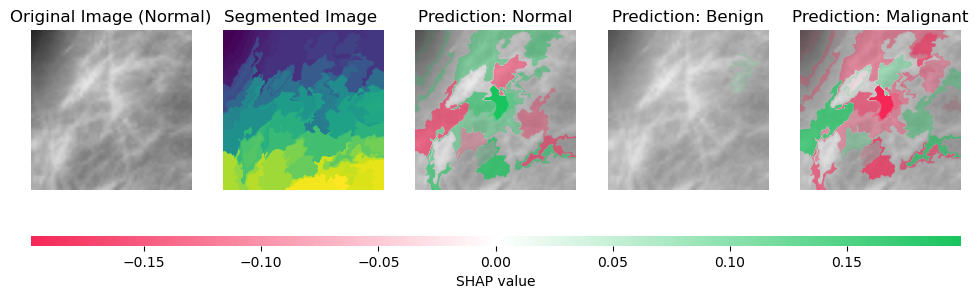

SHAP Kernel took  5.198579788208008 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step
Actual: Normal 
 Predicted: Normal


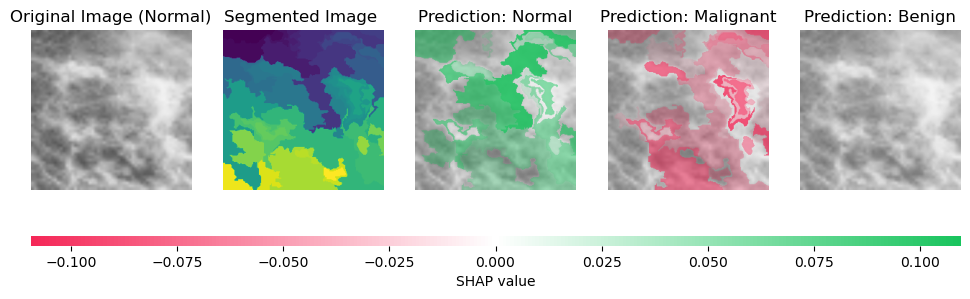

SHAP Kernel took  4.686551094055176 seconds to compute an explanation
1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step
Actual: Malignant 
 Predicted: Benign


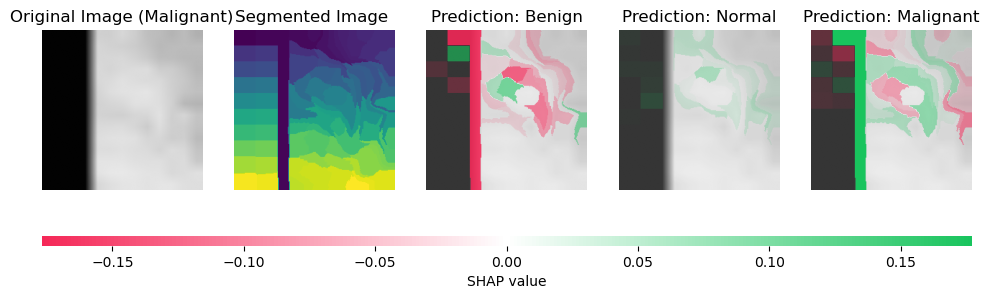

SHAP Kernel took  4.706904649734497 seconds to compute an explanation
1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


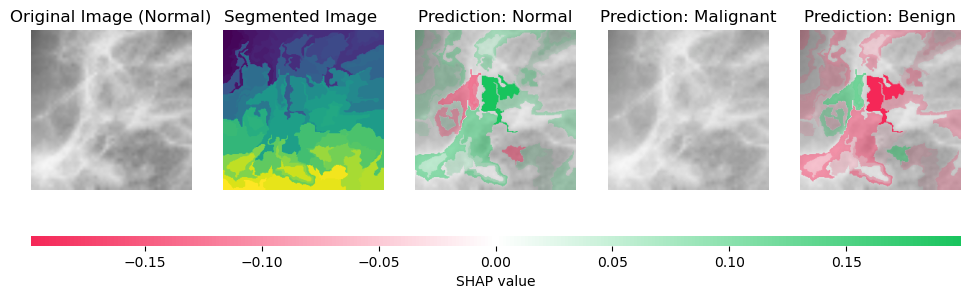

SHAP Kernel took  4.805550575256348 seconds to compute an explanation
1/1 [==============================] - 0s 14ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Malignant 
 Predicted: Malignant


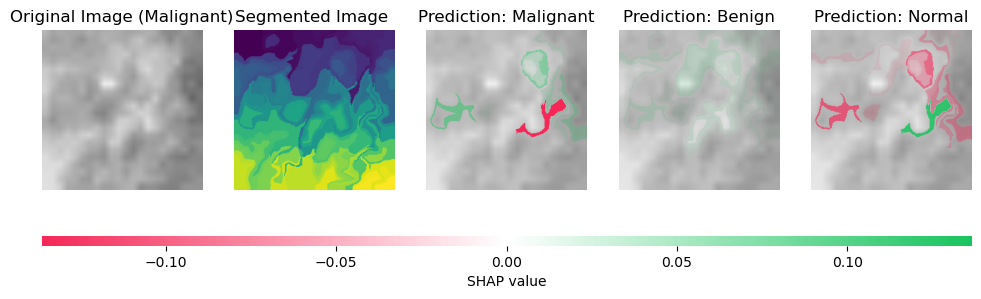

SHAP Kernel took  4.878293991088867 seconds to compute an explanation
1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step
Actual: Malignant 
 Predicted: Malignant


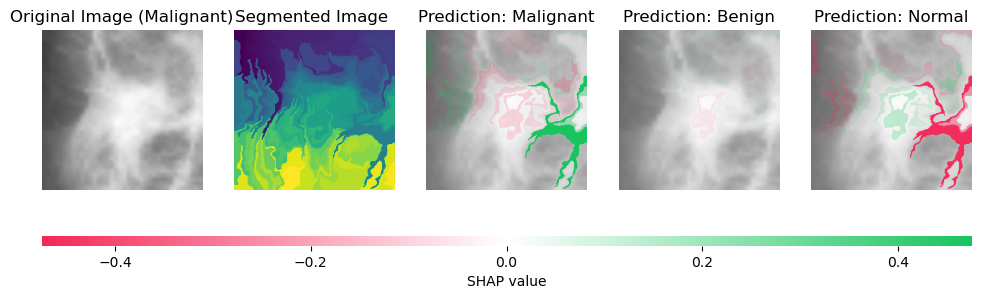

SHAP Kernel took  4.787562608718872 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step
Actual: Normal 
 Predicted: Benign


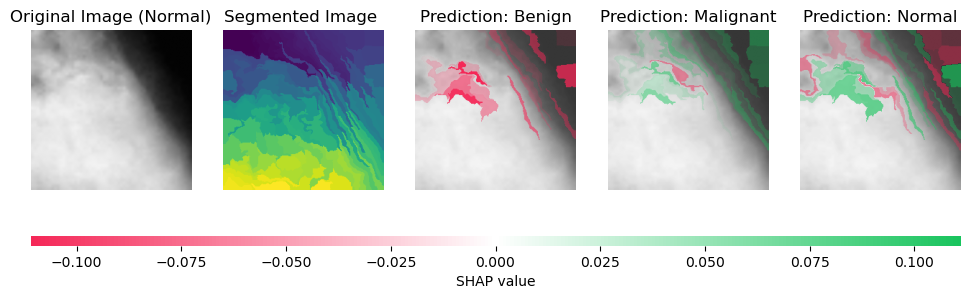

SHAP Kernel took  4.599958896636963 seconds to compute an explanation
1/1 [==============================] - 0s 23ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step
Actual: Malignant 
 Predicted: Benign


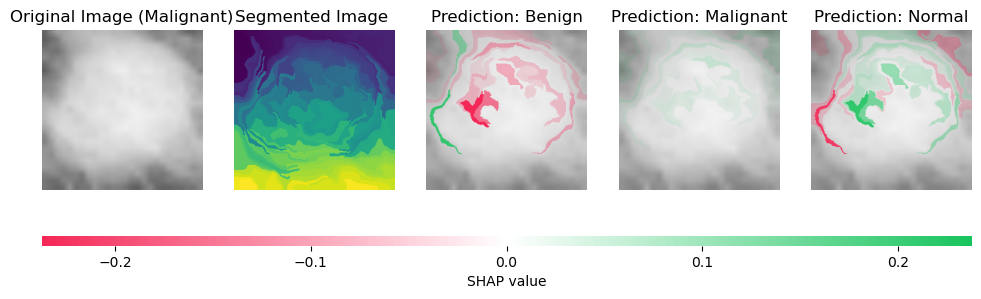

SHAP Kernel took  4.82876992225647 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step
Actual: Normal 
 Predicted: Malignant


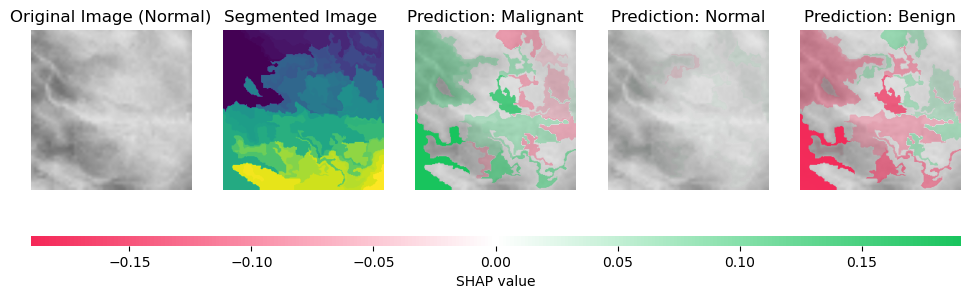

SHAP Kernel took  4.808783054351807 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Benign 
 Predicted: Benign


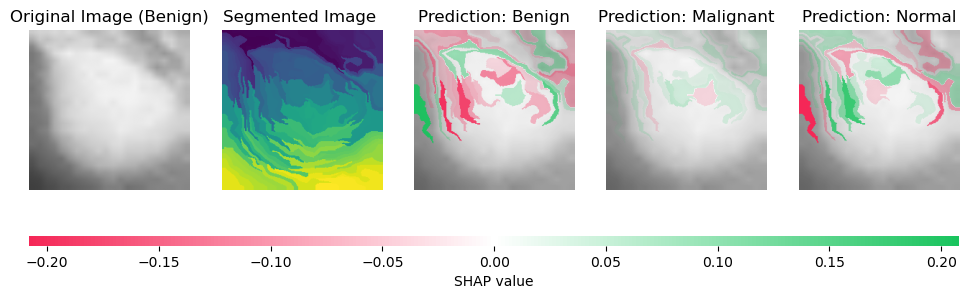

SHAP Kernel took  4.5438477993011475 seconds to compute an explanation
1/1 [==============================] - 0s 34ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step
Actual: Benign 
 Predicted: Benign


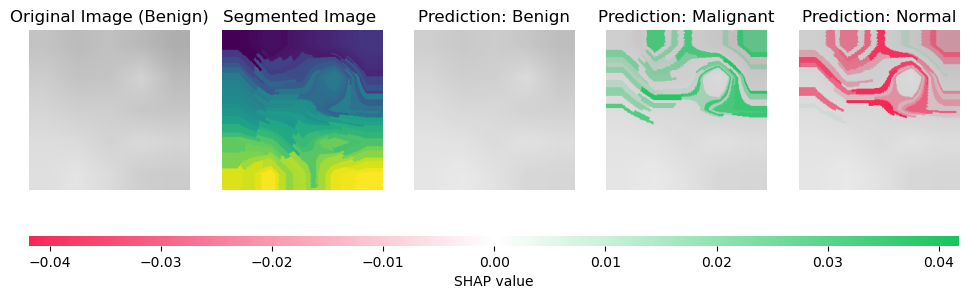

SHAP Kernel took  4.820953369140625 seconds to compute an explanation
1/1 [==============================] - 0s 18ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Actual: Normal 
 Predicted: Normal


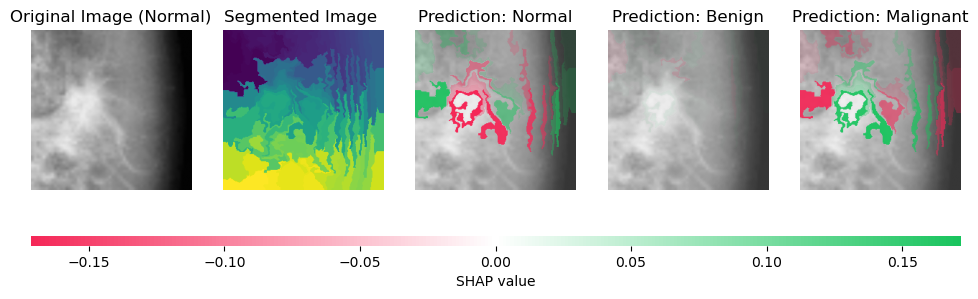

SHAP Kernel took  4.906224727630615 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step
Actual: Normal 
 Predicted: Normal


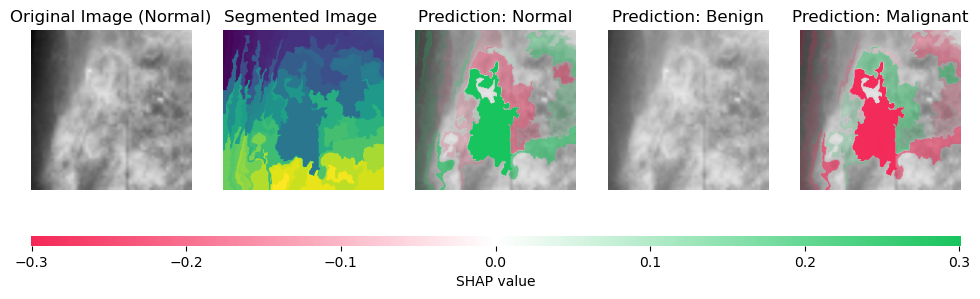

SHAP Kernel took  4.87243914604187 seconds to compute an explanation
1/1 [==============================] - 0s 20ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step
Actual: Normal 
 Predicted: Normal


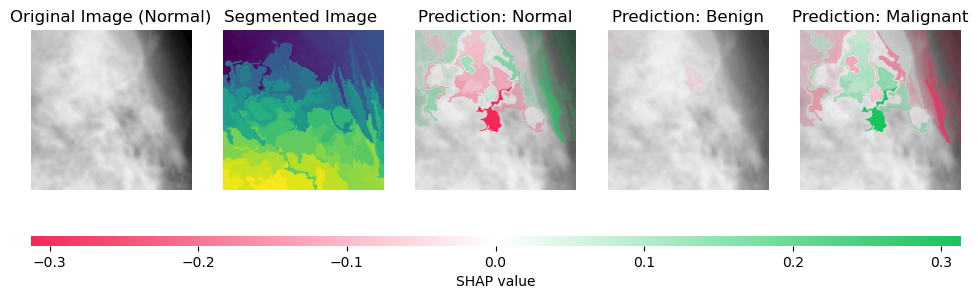

SHAP Kernel took  4.614979982376099 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step
Actual: Normal 
 Predicted: Normal


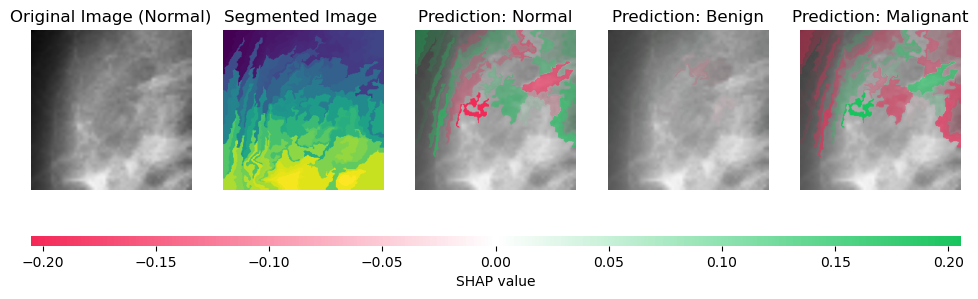

SHAP Kernel took  4.564346790313721 seconds to compute an explanation
1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step
Actual: Normal 
 Predicted: Normal


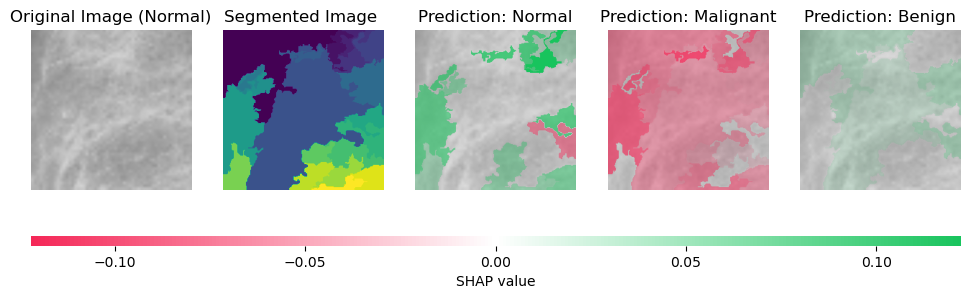

SHAP Kernel took  3.8295257091522217 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step
Actual: Normal 
 Predicted: Normal


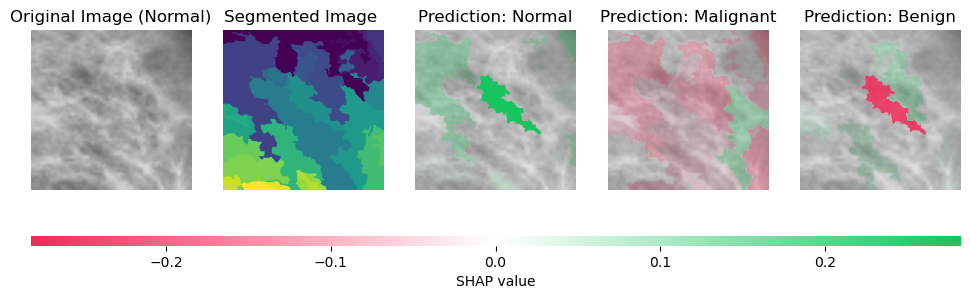

SHAP Kernel took  4.188591003417969 seconds to compute an explanation
3
{0: [(array([[[0.4627451 , 0.4627451 , 0.4627451 ],
        [0.4627451 , 0.4627451 , 0.4627451 ],
        [0.47058824, 0.47058824, 0.47058824],
        ...,
        [0.02745098, 0.02745098, 0.02745098],
        [0.02745098, 0.02745098, 0.02745098],
        [0.02745098, 0.02745098, 0.02745098]],

       [[0.4627451 , 0.4627451 , 0.4627451 ],
        [0.4627451 , 0.4627451 , 0.4627451 ],
        [0.47058824, 0.47058824, 0.47058824],
        ...,
        [0.02745098, 0.02745098, 0.02745098],
        [0.02745098, 0.02745098, 0.02745098],
        [0.02745098, 0.02745098, 0.02745098]],

       [[0.46666667, 0.46666667, 0.46666667],
        [0.46666667, 0.46666667, 0.46666667],
        [0.47058824, 0.47058824, 0.47058824],
        ...,
        [0.02745098, 0.02745098, 0.02745098],
        [0.02745098, 0.02745098, 0.02745098],
        [0.02745098, 0.02745098, 0.02745098]],

       ...,

       [[0.62352941, 0.62352941, 0.6

In [13]:
## saving all overlaid feature activation maps per class
class_dict = {}
total_time = 0
for idx, (img, lab) in enumerate(zip(x_test, labels)):
    pred = np.argmax(model.predict(np.array([img])))
    # plot Grad-CAM of the third convolutional layer
    img, filled_seg, cm, max_val, t = shapvals(img, lab, seg = 100, compact = 1)
    # create a dictionary with {pred_label: (img, filled_seg, cm, max_val, true_label) to plot the images per prediction
    try:
        class_dict[pred].append((img,filled_seg,cm,max_val, lab))
    except:
        class_dict[pred] = [(img,filled_seg,cm,max_val, lab)]
    total_time += t # add time to total count
           
print(len(class_dict))
print(class_dict)


In [14]:
print(f"The total time used to compute KernelSHAP values were on average {total_time/len(labels)} seconds")

The total time used to compute KernelSHAP values were on average 4.6515218416849775 seconds


## Plot Explanations per predicted class

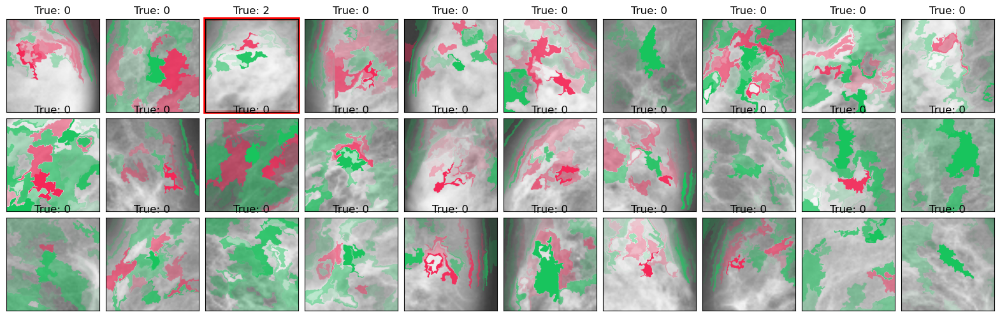

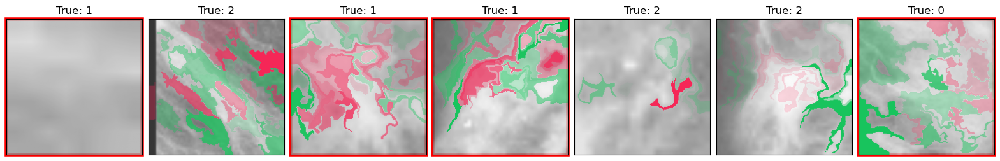

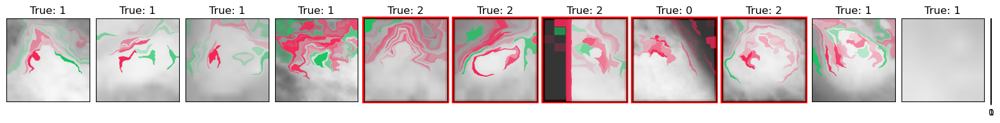

In [17]:
colrow = [(3,10), (1,7), (1,12)]

for cr, (k, v) in zip(colrow, class_dict.items()): # loop over the predicted labels
    label_names = ["Normal", "Benign", "Malignant"]
    #print(k) # the predicted label
    #print(len(v)) ## v is a list of tuples 
    true_pred = list(filter(lambda x: x[4] == k, v)) # filter the correct labels
    false_pred = list(filter(lambda x: x[4] != k, v)) # filter the incorrect cases
    #print(len(true_pred), len(false_pred))
   
    fig = plt.figure(figsize=(20., 10.))
    plt.rcParams['font.size'] = 10

    #plt.suptitle('Predicted Class: {}'.format(label_names[k]), fontsize=12,y = -0.1)
    ## define an image grid
    grid = ImageGrid(fig, 111,
                     nrows_ncols=cr,
                     axes_pad=0.1,
                     )
    # loop over the images with their respective predictions and heatmaps and plot a grid per prediction with incorrect predictions marked in red
    for i, ((img, filled_seg,cm,max_val, lab), is_true) in enumerate(zip(v, [lab==k for (_,_,_,_,lab) in v])): # (img,filled_seg,cm,max_val, lab)
        ax = grid[i]
        ax.imshow(img, alpha = 0.8) # plot the image
        ax.imshow(filled_seg, cmap=cm, vmin=-max_val, vmax=max_val) # add the mask to the image
        ax.set_title('True: {}'.format(lab)) # , y = -0.12, alpha = 0.8
        if not is_true:
            #print(is_true)
           # ax.set_frame_on(True)
            ax.patch.set_edgecolor('red') # mark images that are incorrectly predicted with a red box
            ax.patch.set_linewidth(4)
        #ax.axis("off")
        ax.set_xticks([]) # remove the axis
        ax.set_yticks([])
        ax.set_xlabel('') # remove labels
        ax.set_ylabel('')

    plt.show()
    #plt.savefig(f"gradcamPlots_{label_names[k]}")


## Testing robustness of model  by running the model on image idx = 36 five times

1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step
Actual: Malignant 
 Predicted: Malignant


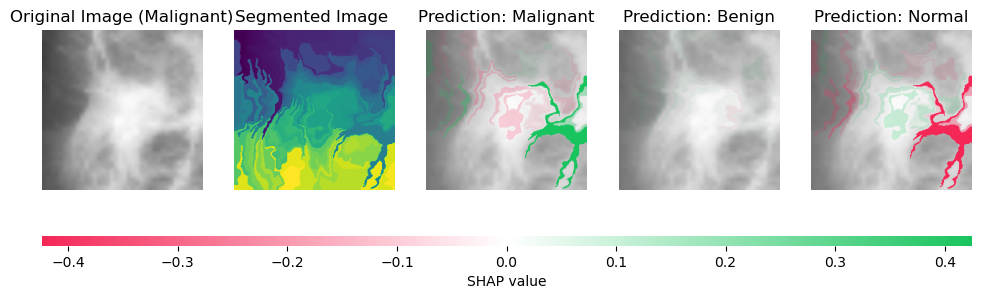

SHAP Kernel took  4.5051429271698 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 12ms/step
Actual: Malignant 
 Predicted: Malignant


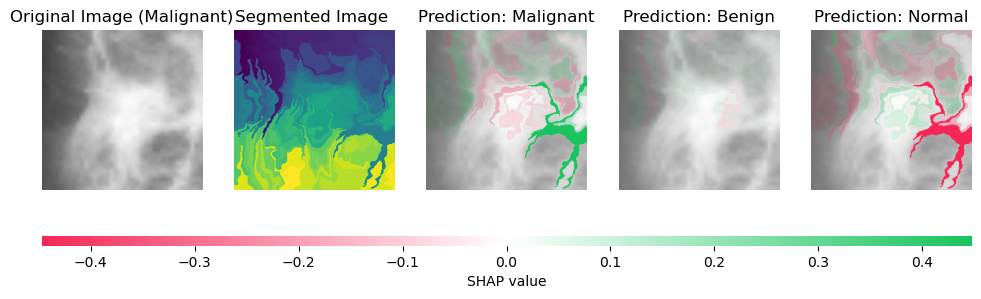

SHAP Kernel took  4.524948358535767 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step
Actual: Malignant 
 Predicted: Malignant


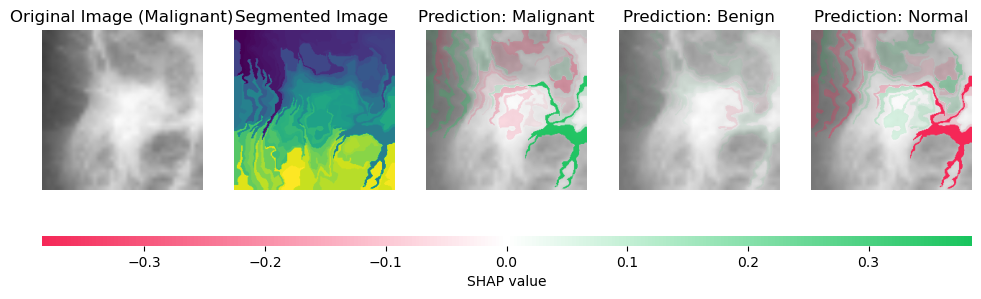

SHAP Kernel took  4.607049465179443 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step
Actual: Malignant 
 Predicted: Malignant


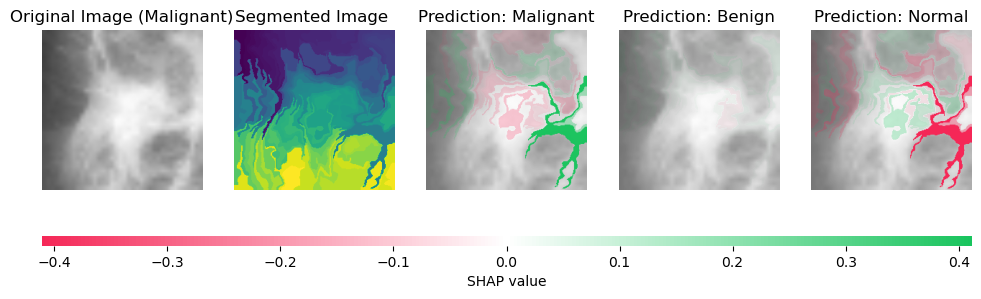

SHAP Kernel took  4.650822162628174 seconds to compute an explanation
1/1 [==============================] - 0s 16ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step
Actual: Malignant 
 Predicted: Malignant


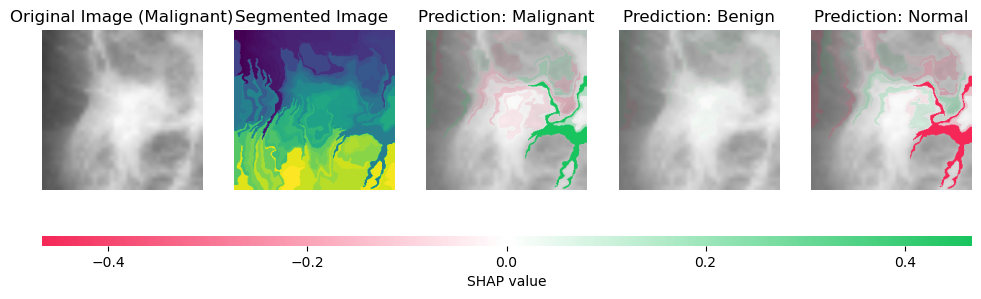

SHAP Kernel took  4.509040594100952 seconds to compute an explanation


In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

#fig = plt.figure(figsize=(10, 5))
#grid = ImageGrid(fig, 111, nrows_ncols=(1, 4), axes_pad=0.1)

idx = 36
img = x_test[idx]
lab = labels[idx]
image_list = []
# run the model 5 times and store results
for i in range(5):
    img, filled_seg, cm, max_val, t = shapvals(img, lab, seg = 100, compact = 1)
    image_list.append((img, filled_seg, cm, max_val))

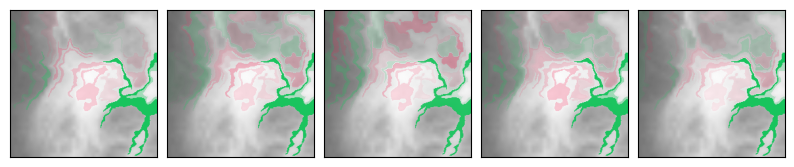

In [20]:
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(1, 5), axes_pad=0.1)
## plots all masks overlaid on the original image of the five iterations in a grid
for i, (img, filled_seg, cm, max_val) in enumerate(image_list):
    ax = grid[i]
    ax.imshow(img, alpha = 0.8)
    ax.imshow(filled_seg, cmap=cm, vmin=-max_val, vmax=max_val)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()